Using All Modules
==================

Now that we've gone through all of the modules individually, we can start to use them all together, and certain arguments that act in multiple modules.

Here, we'll run all modules in the pipeline together to show what the output looks like. For this, we'll use the light curves from the SDSS-RM object RM160, with data for ${\rm H}\alpha$, ${\rm H}\beta$, and ${\rm MgII}$.

## Define Parameters

In [23]:
output_dir = 'tot_output/'

drw_rej_params = {
    'use_for_javelin': True
}

pyccf_params = {
    'nsim': 5000,
    'interp': 1.5
}

pyzdcf_params = {
    'nsim': 2000,
    'run_plike': True,
    'plike_dir': 'pypetal/plike_v4/',
}

pyroa_params = {
    'nchain': 15000,
    'nburn': 10000,
    'add_var': True,
    'delay_dist': True
}

javelin_params = {
    'nchain': 300,
    'nburn': 100,
    'nwalkers': 100,
    'nbin': 50
}

weighting_params = {
    'k': 2,
    'width': 20
}

lag_bounds = [-1000,1000]

## Run pyPetal

In [2]:
%matplotlib inline
import pypetal.pipeline as pl

main_dir = 'pypetal/examples/dat/rm160_'
line_names = ['cont', 'ha', 'hb', 'mg2']
filenames = [ main_dir + x + '.dat' for x in line_names ]


Performing DRW rejection
------------------------
jitter: True
nsig: 3
nwalker: 100
nburn: 300
nchain: 1000
clip: array
reject_data: [ True False False False]
use_for_javelin: True
------------------------
        


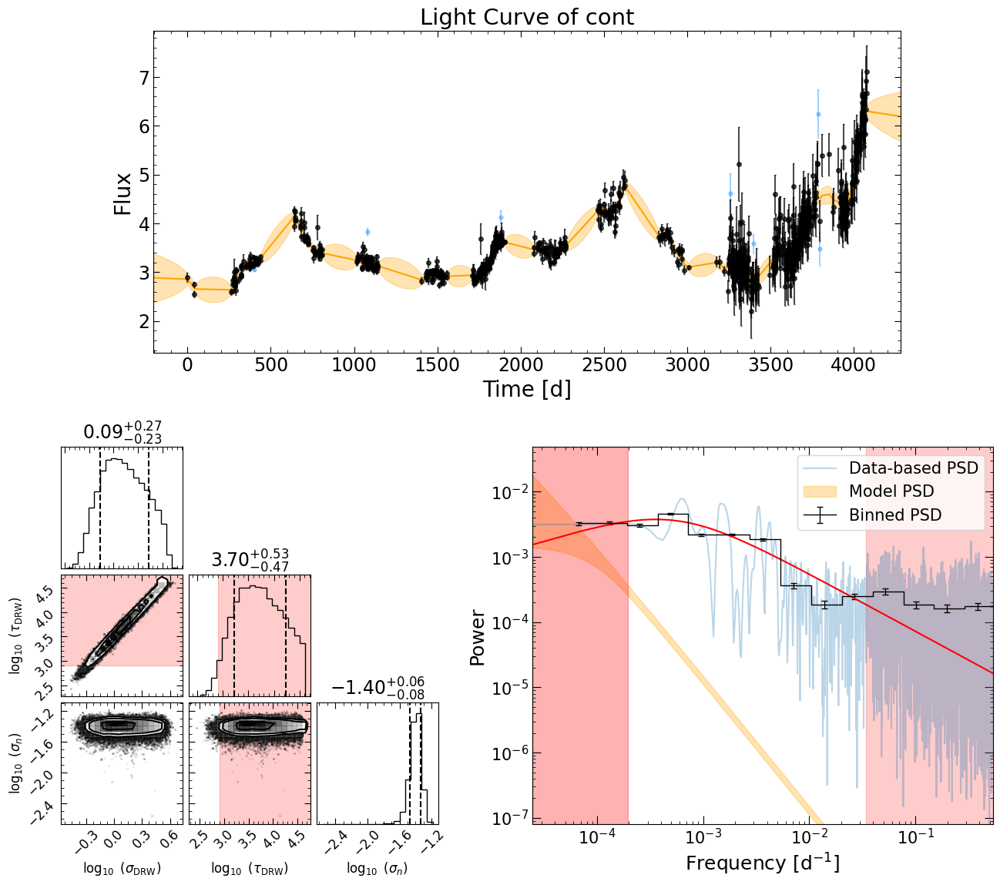


Running pyCCF
-----------------
lag_bounds: array
interp: 1.5
nsim: 5000
mcmode: 0
sigmode: 0.2
thres: 0.8
nbin: 50
-----------------
        
Failed centroids:  0
Failed peaks:  0


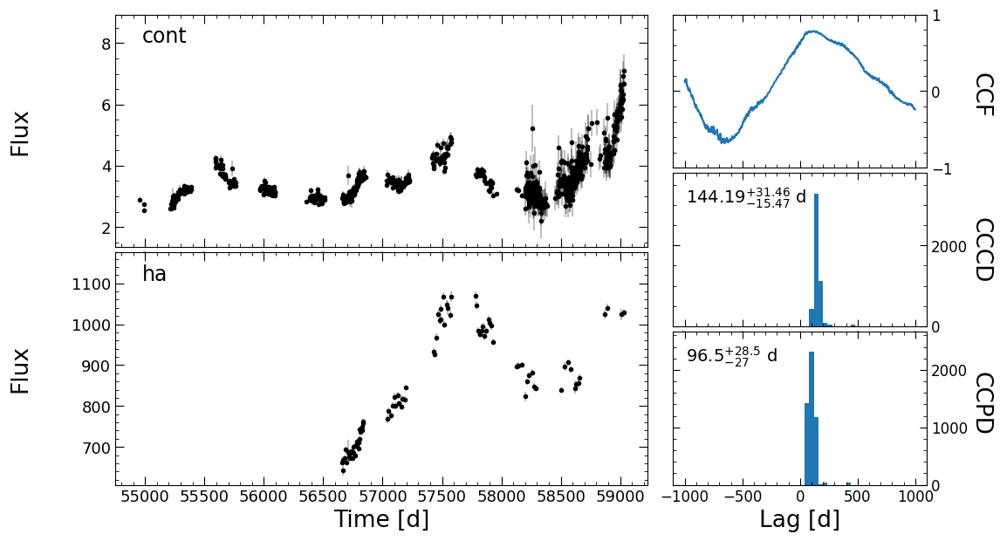

Failed centroids:  0
Failed peaks:  0


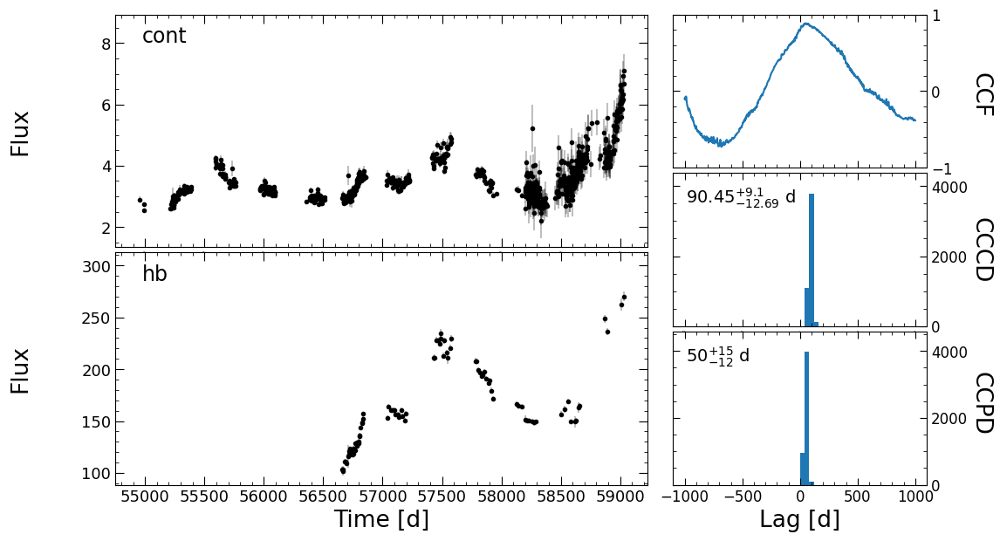

Failed centroids:  0
Failed peaks:  0


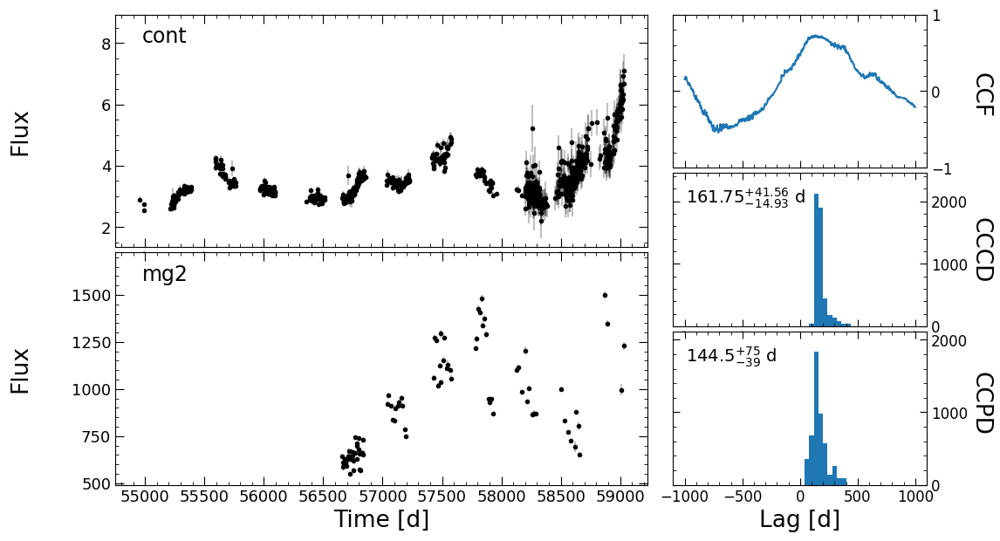


Running pyZDCF
----------------------
nsim: 2000
minpts: 0
uniform_sampling: False
omit_zero_lags: True
sparse: auto
prefix: zdcf
run_plike: True
plike_dir: pypetal/plike_v4/
----------------------
        
Executing PLIKE


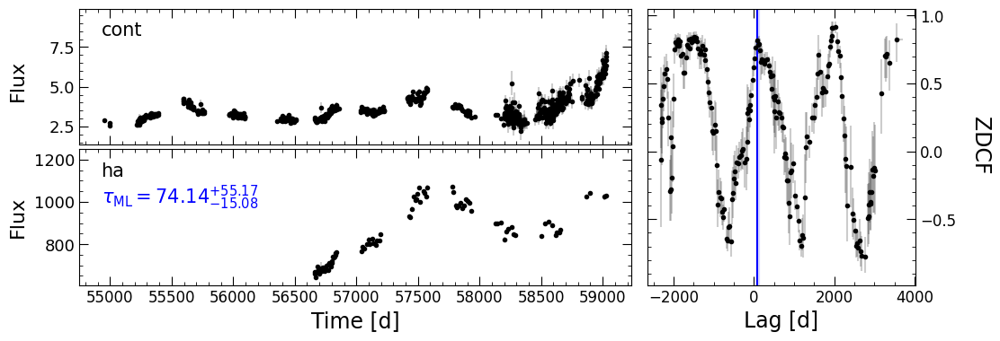

Executing PLIKE


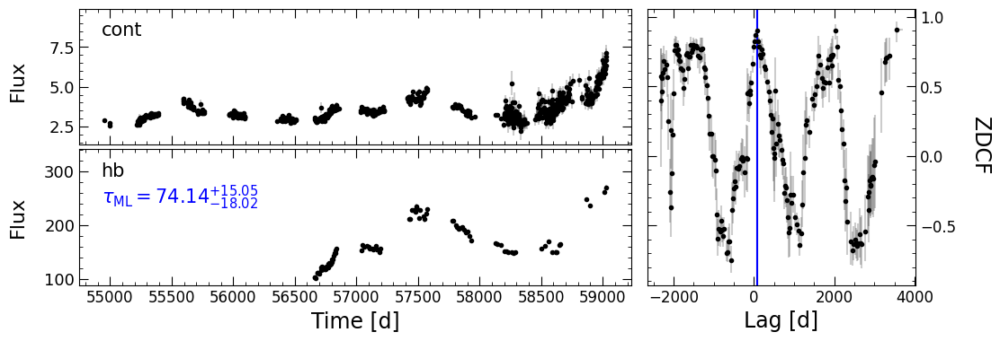

Executing PLIKE


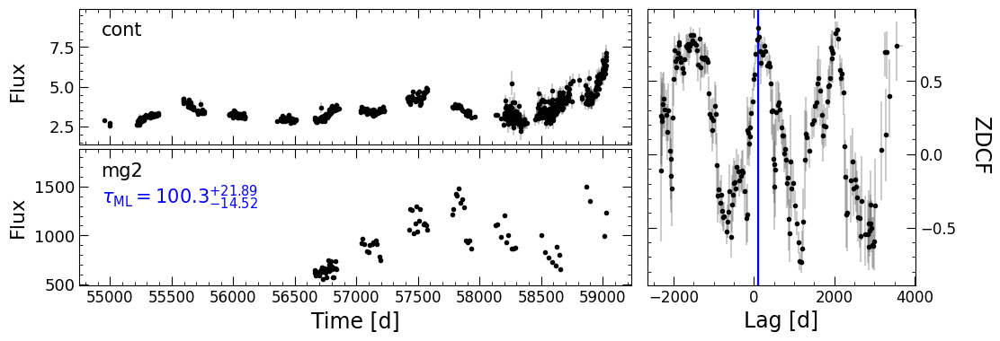


Running PyROA
----------------
nburn: 10000
nchain: 15000
init_tau: [10.0, 10.0, 10.0]
subtract_mean: True
div_mean: False
add_var: True
delay_dist: True
psi_types: ['Gaussian', 'Gaussian', 'Gaussian']
together: True
objname: pyroa
----------------
        
Initial Parameter Values
      A0           B0    σ0       A1           B1    τ1    Δ1    σ1       A2           B2    τ2    Δ2    σ2       A3            B3    τ3    Δ3    σ3    Δ
--------  -----------  ----  -------  -----------  ----  ----  ----  -------  -----------  ----  ----  ----  -------  ------------  ----  ----  ----  ---
0.722173  2.29207e-16  0.01  132.496  9.85286e-14    10     1  0.01  40.3867  6.00014e-15    10     1  0.01  255.289  -5.05275e-14    10     1  0.01   10
NWalkers=42


100%|██████████| 15000/15000 [59:29<00:00,  4.20it/s] 


Filter: cont
Mean Delay, error: 0.00 (fixed)
Filter: ha
Mean Delay, error:  124.91366  (+  20.71345 -   6.34378)
Filter: hb
Mean Delay, error:   62.24537  (+  33.51759 -   7.05950)
Filter: mg2
Mean Delay, error:  117.42968  (+   8.12748 -   9.87701)


Best Fit Parameters
     A0          B0         σ0       A1       B1       τ1       Δ1       σ1       A2        B2       τ2       Δ2       σ2       A3       B3      τ3       Δ3       σ3        Δ
-------  ----------  ---------  -------  -------  -------  -------  -------  -------  --------  -------  -------  -------  -------  -------  ------  -------  -------  -------
0.66711  -0.0154108  0.0588267  131.065  2.59755  124.914  32.5117  30.9587  40.0112  0.440908  62.2454  58.3884  6.48461  234.054  3.79858  117.43  8.47961  96.0668  24.0498


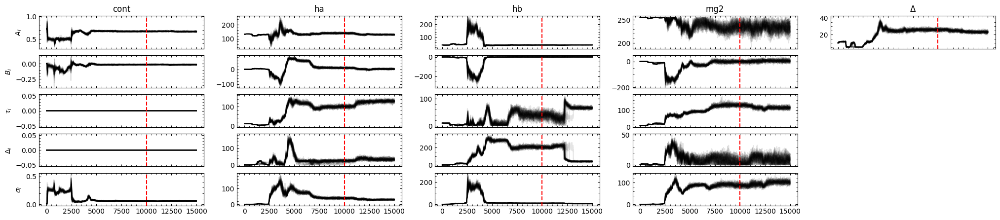

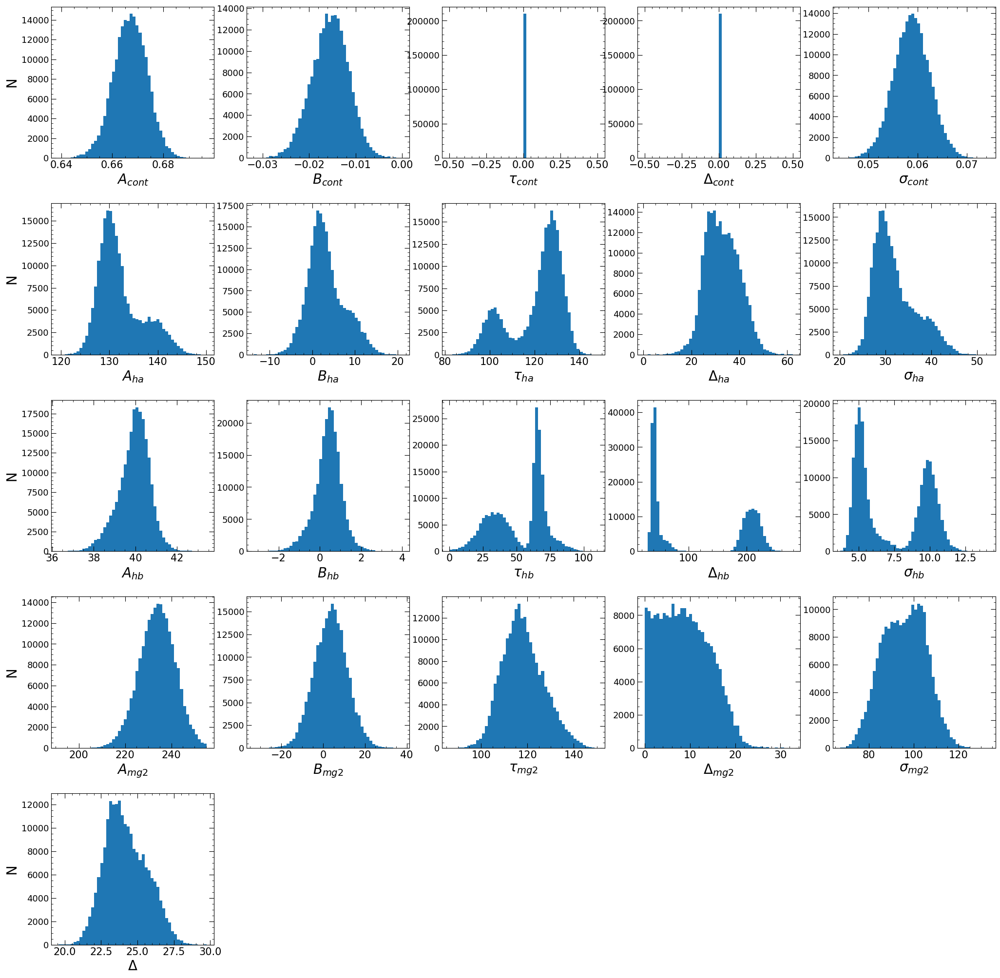

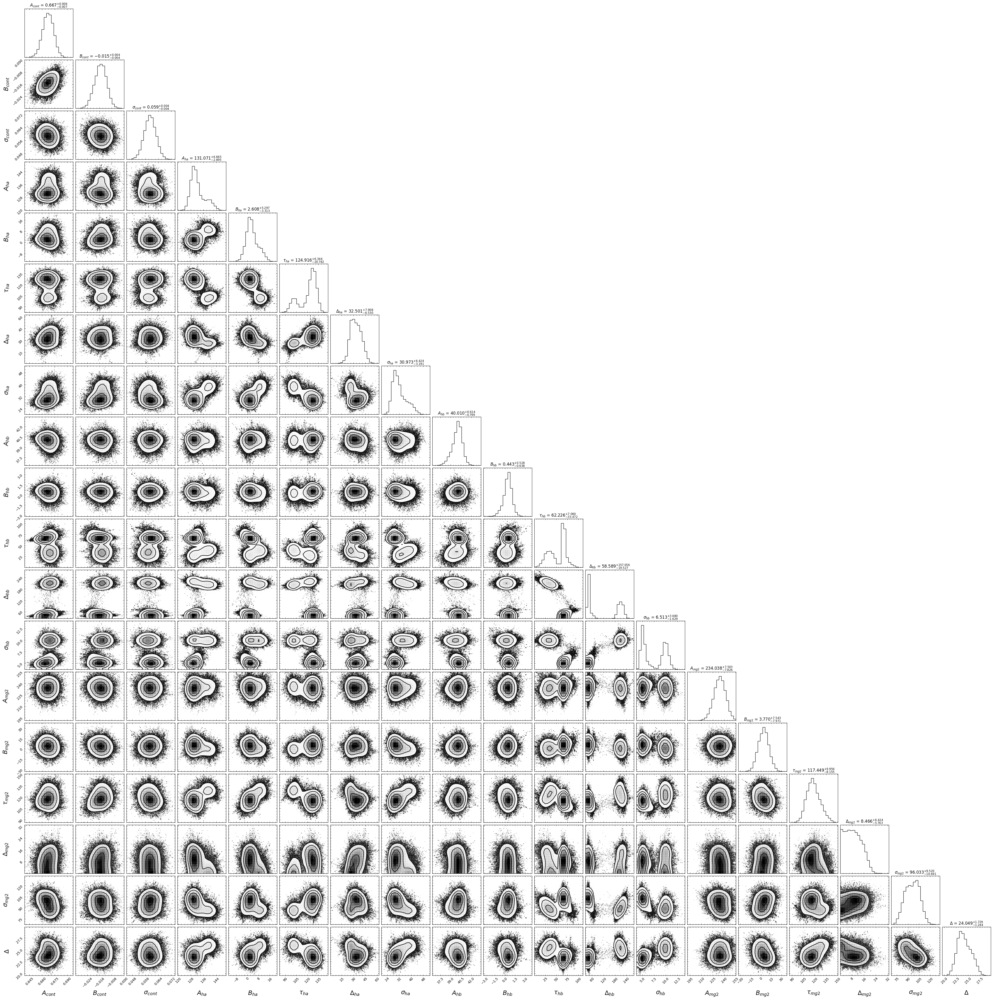

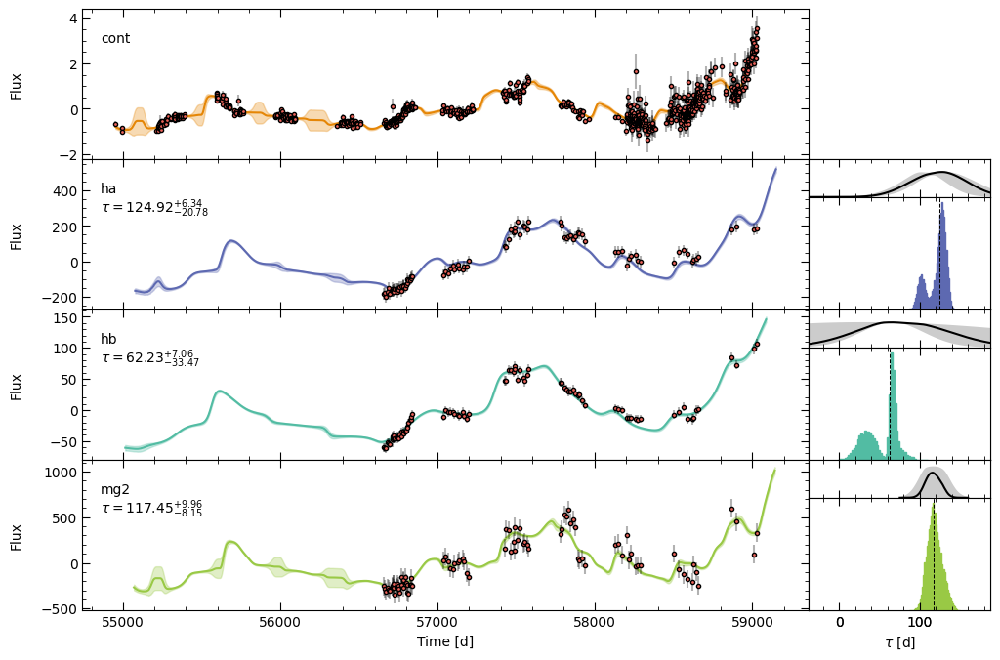

In [3]:
_ = pl.run_pipeline( output_dir, filenames, line_names,
                    run_drw_rej=True, drw_rej_params=drw_rej_params,
                    run_pyccf=True, pyccf_params=pyccf_params,
                    run_pyzdcf=True, pyzdcf_params=pyzdcf_params,
                    run_pyroa=True, pyroa_params=pyroa_params,
                    verbose=True,
                    plot=True,
                    file_fmt='ascii',
                    time_unit='d',
                    lag_bounds=lag_bounds,
                    threads=45)

## Run pyPetal-jav

In [1]:
%matplotlib inline
import pypetal_jav.pipeline as plj
import numpy as np

line_names = ['cont', 'ha', 'hb', 'mg2']
output_dir = 'tot_output/'

In [2]:
#Construct the drw_rej resulting dictionary with the parameters needed

taus = []
sigmas = []

reject_data = [True, False, False, False]
for i in range(len(reject_data)):
    if reject_data[i]:
        s, t = np.loadtxt( output_dir + line_names[i] + '/drw_rej/' + line_names[i] + '_chain.dat',
                           usecols=[0,1], unpack=True, delimiter=',')

        sigmas.append(s)
        taus.append(t)        
        

drw_rej_res = {
    'reject_data': reject_data,
    'taus': taus,
    'sigmas': sigmas
}


Running JAVELIN
--------------------
rm_type: spec
lagtobaseline: 0.3
laglimit: array
fixed: True
p_fix: True
subtract_mean: True
nwalker: 100
nburn: 100
nchain: 300
output_chains: True
output_burn: True
output_logp: True
nbin: 50
metric: med
together: False
--------------------
        
run parallel chains of number 40 
start burn-in
no priors on sigma and tau
penalize lags longer than 0.30 of the baseline
nburn: 100 nwalkers: 100 --> number of burn-in iterations: 10000
burn-in finished
save burn-in chains to /home/stone28/pypetal/tot_output/ha/javelin/burn_rmap.txt
start sampling
sampling finished
acceptance fractions are
0.30 0.16 0.32 0.21 0.36 0.25 0.29 0.30 0.28 0.27 0.03 0.35 0.36 0.05 0.15 0.10 0.31 0.16 0.27 0.28 0.31 0.13 0.28 0.24 0.33 0.36 0.26 0.29 0.34 0.04 0.31 0.25 0.16 0.30 0.29 0.19 0.31 0.30 0.30 0.26 0.35 0.29 0.28 0.23 0.21 0.30 0.29 0.30 0.35 0.29 0.30 0.30 0.10 0.09 0.10 0.08 0.27 0.17 0.34 0.28 0.34 0.36 0.41 0.33 0.34 0.32 0.13 0.27 0.07 0.31 0.27 0.11 0.35 0.

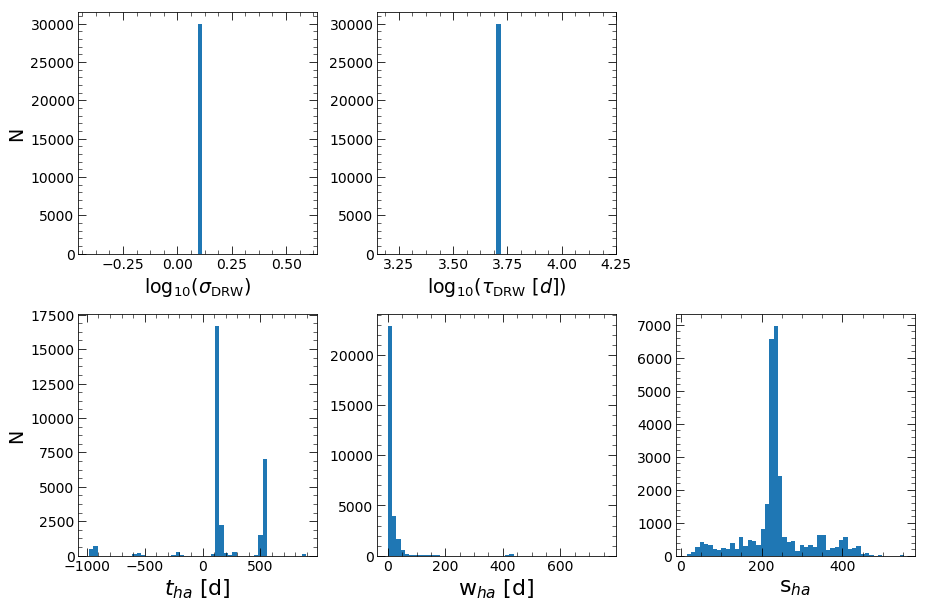

covariance matrix calculated
covariance matrix decomposed and updated by U


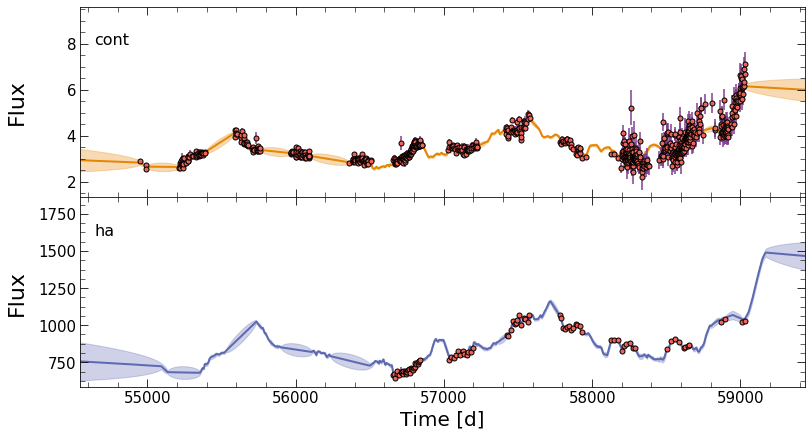

run parallel chains of number 40 
start burn-in
no priors on sigma and tau
penalize lags longer than 0.30 of the baseline
nburn: 100 nwalkers: 100 --> number of burn-in iterations: 10000
burn-in finished
save burn-in chains to /home/stone28/pypetal/tot_output/hb/javelin/burn_rmap.txt
start sampling
sampling finished
acceptance fractions are
0.17 0.28 0.18 0.18 0.20 0.29 0.23 0.23 0.16 0.27 0.22 0.16 0.29 0.17 0.20 0.23 0.19 0.18 0.17 0.31 0.25 0.19 0.31 0.30 0.35 0.08 0.24 0.15 0.25 0.18 0.31 0.18 0.18 0.30 0.31 0.12 0.27 0.27 0.13 0.21 0.29 0.22 0.20 0.16 0.09 0.23 0.17 0.39 0.08 0.24 0.28 0.26 0.27 0.22 0.27 0.28 0.24 0.22 0.27 0.10 0.30 0.25 0.24 0.24 0.19 0.25 0.24 0.24 0.25 0.23 0.26 0.19 0.19 0.27 0.19 0.20 0.23 0.22 0.27 0.24 0.19 0.17 0.28 0.23 0.21 0.22 0.23 0.14 0.31 0.17 0.05 0.28 0.17 0.23 0.18 0.17 0.24 0.23 0.21 0.24
save MCMC chains to /home/stone28/pypetal/tot_output/hb/javelin/chain_rmap.txt
save logp of MCMC chains to /home/stone28/pypetal/tot_output/hb/javelin/logp_r

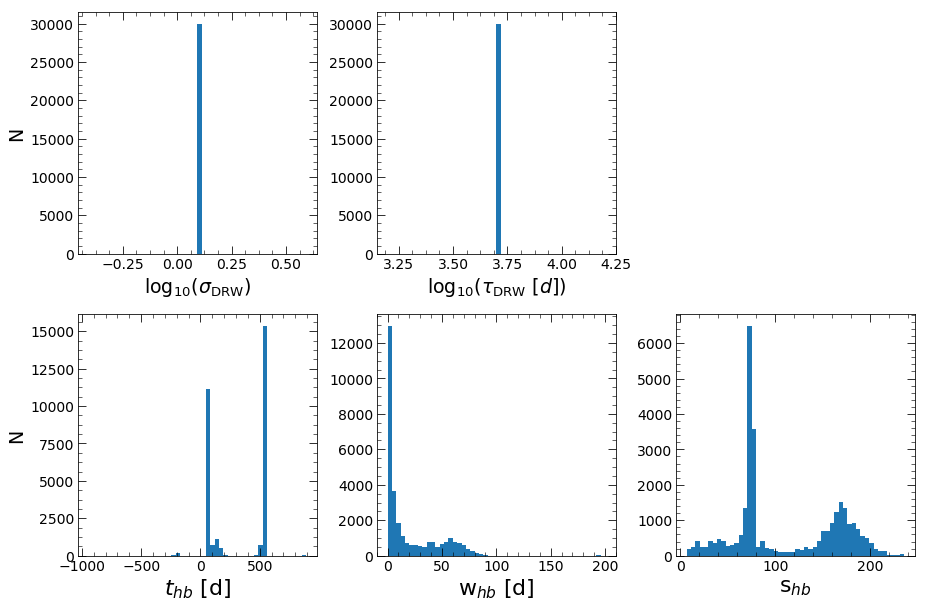

covariance matrix calculated
covariance matrix decomposed and updated by U


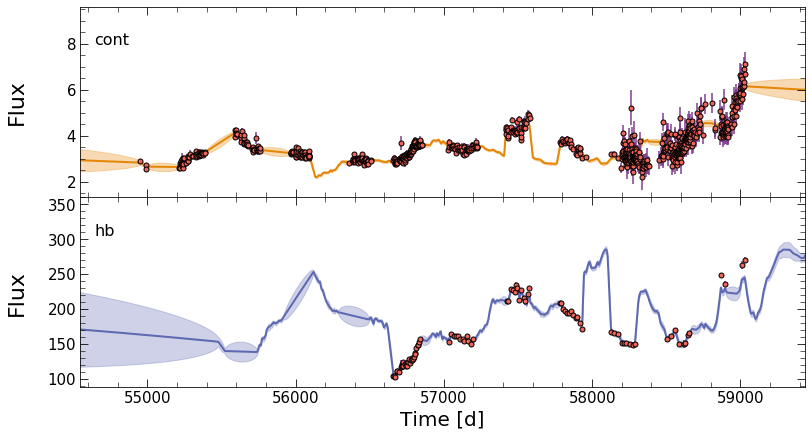

run parallel chains of number 40 
start burn-in
no priors on sigma and tau
penalize lags longer than 0.30 of the baseline
nburn: 100 nwalkers: 100 --> number of burn-in iterations: 10000
burn-in finished
save burn-in chains to /home/stone28/pypetal/tot_output/mg2/javelin/burn_rmap.txt
start sampling
sampling finished
acceptance fractions are
0.22 0.19 0.20 0.20 0.17 0.21 0.21 0.07 0.07 0.22 0.14 0.22 0.22 0.16 0.18 0.13 0.25 0.14 0.21 0.27 0.15 0.21 0.06 0.24 0.10 0.25 0.23 0.23 0.17 0.10 0.14 0.21 0.08 0.20 0.14 0.22 0.21 0.17 0.20 0.27 0.25 0.28 0.08 0.17 0.20 0.17 0.19 0.20 0.19 0.23 0.15 0.19 0.24 0.23 0.21 0.18 0.26 0.21 0.22 0.10 0.22 0.19 0.22 0.23 0.20 0.18 0.19 0.22 0.07 0.23 0.26 0.18 0.23 0.22 0.24 0.20 0.23 0.25 0.20 0.18 0.25 0.22 0.17 0.18 0.19 0.19 0.20 0.24 0.03 0.08 0.22 0.16 0.18 0.20 0.07 0.27 0.20 0.18 0.21 0.22
save MCMC chains to /home/stone28/pypetal/tot_output/mg2/javelin/chain_rmap.txt
save logp of MCMC chains to /home/stone28/pypetal/tot_output/mg2/javelin/log

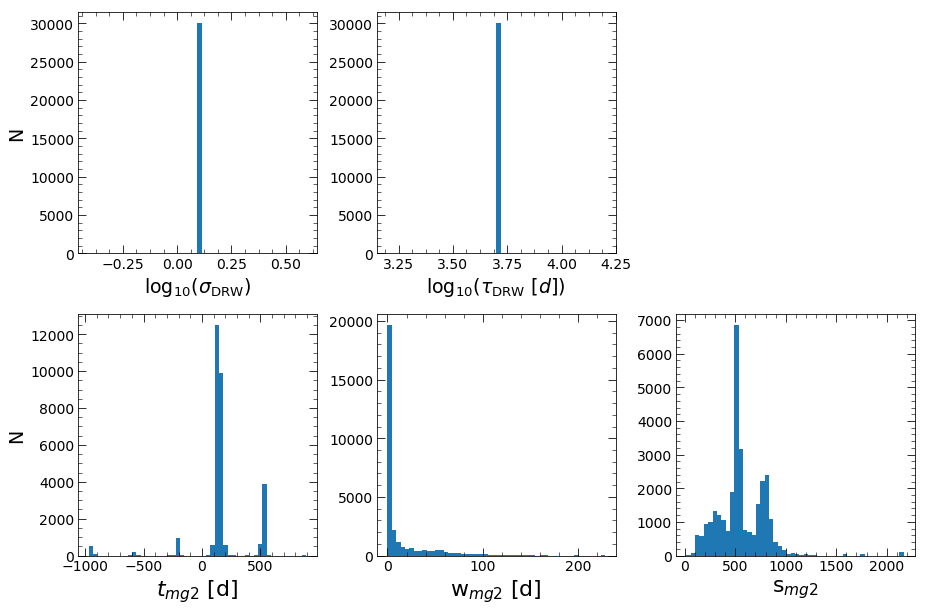

covariance matrix calculated
covariance matrix decomposed and updated by U


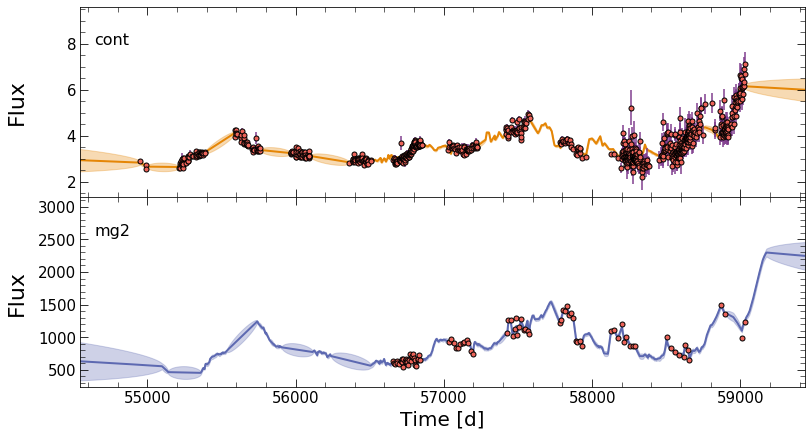

In [4]:
_ = plj.run_pipeline( output_dir, line_names,
                 javelin_params=javelin_params,
                 use_for_javelin=True,
                 drw_rej_res=drw_rej_res,
                 verbose=True,
                 plot=True,
                 file_fmt='ascii',
                 time_unit='d',
                 lag_bounds=lag_bounds,
                 threads=40)

We can see that the JAVELIN fit for ${\rm H}\beta$ found a time lag in the seasonal gap, let's see if the weighting can fix it.

## Run Weighting

In [24]:
%matplotlib inline
import pypetal.pipeline as pl

line_names = ['cont', 'ha', 'hb', 'mg2']
output_dir = 'tot_output/'

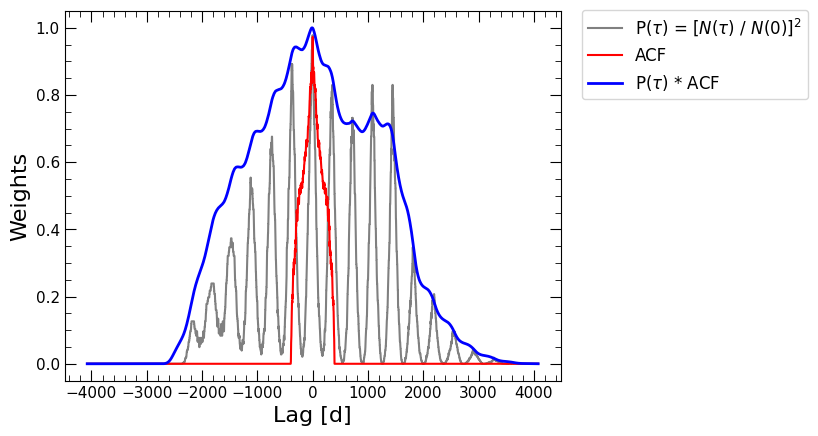

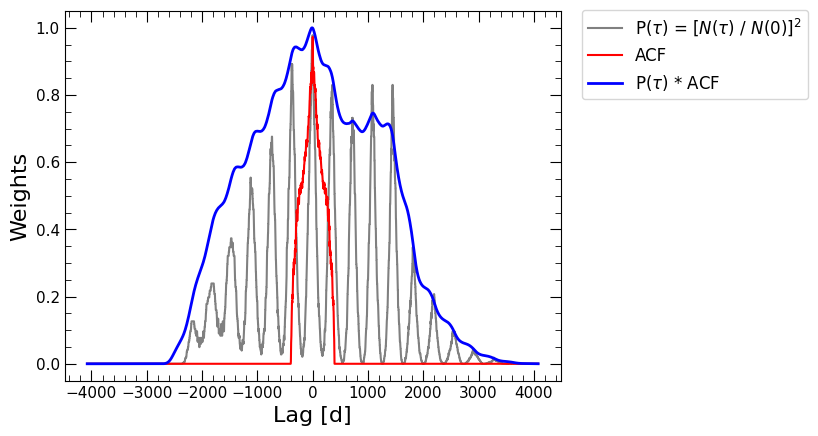

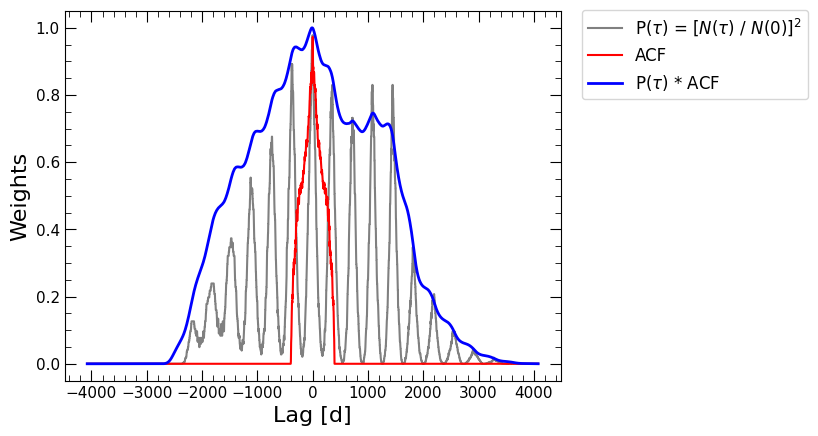

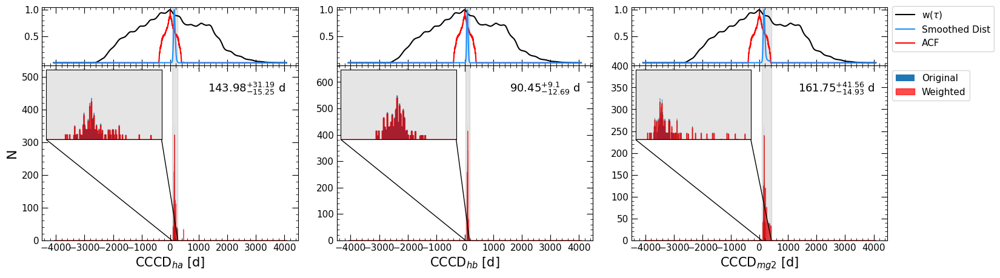

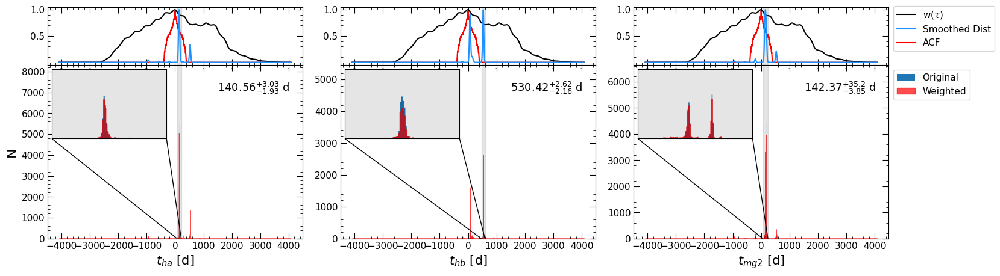

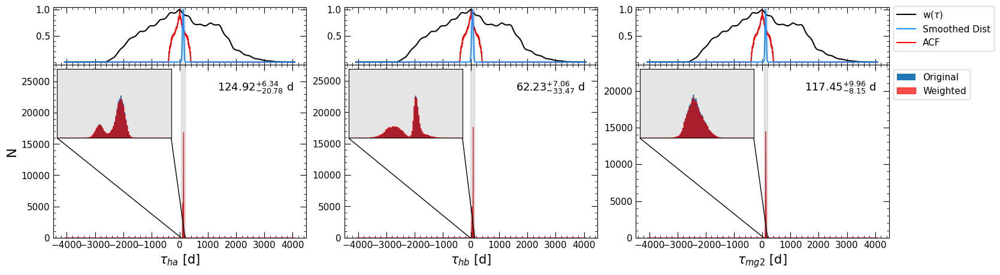

In [25]:
_ = pl.run_weighting( output_dir, line_names,
                  run_pyccf=True, pyccf_params=pyccf_params,
                  run_pyroa=True, pyroa_params=pyroa_params,
                  run_javelin=True, javelin_params=javelin_params,
                  weighting_params=weighting_params,
                  verbose=True,
                  plot=True,
                  file_fmt='ascii',
                  time_unit='d',
                  lag_bounds=lag_bounds,
                  threads=40)

## Results

In [26]:
from pypetal.utils import load
res, summary = load('tot_output/', verbose=True)


Prior pyPetal run
---------------------
DRW Rejection: True
pyCCF: True
pyZDCF: True
PyROA: True
JAVELIN: True
Weighting: True
---------------------



In [32]:
import numpy as np

print( 'line names:', res['weighting_res']['names'] )
print('')

#pyCCF lags
print( 'pyCCF lags:', np.array(res['weighting_res']['pyccf']['centroid']).T[1] )
print( 'pyCCF fraction rejected:', res['weighting_res']['pyccf']['frac_rejected'] )
print( 'pyCCF rmax:', res['weighting_res']['rmax_pyccf'] )
print('')

#PyROA lags
print( 'PyROA lags:', np.array(res['weighting_res']['pyroa']['time_delay']).T[1] )
print( 'PyROA fraction rejected:', res['weighting_res']['pyroa']['frac_rejected'] )
print( 'PyROA rmax:', res['weighting_res']['rmax_pyroa'] )
print('')


#JAVELIN lags
print( 'JAVELIN lags:', np.array(res['weighting_res']['javelin']['tophat_lag']).T[1] )
print( 'JAVELIN fraction rejected:', res['weighting_res']['javelin']['frac_rejected'] )
print( 'JAVELIN rmax:', res['weighting_res']['rmax_javelin'] )

line names: ['mg2', 'ha', 'hb']

pyCCF lags: [161.74835 143.97702  90.45125]
pyCCF fraction rejected: [0.0, 0.009, 0.0]
pyCCF rmax: [0.7168318, 0.7787244, 0.86478585]

PyROA lags: [117.44938  124.91558   62.226303]
PyROA fraction rejected: [0.0, 0.0, 0.0]
PyROA rmax: [0.7254955, 0.7844358, 0.8867146]

JAVELIN lags: [142.36792 140.56485 530.4232 ]
JAVELIN fraction rejected: [0.2165, 0.36016667, 0.46193334]
JAVELIN rmax: [0.72558135, 0.7767819, 0.11873911]


The lag results obtained in this run are relatively good, with high $r_{max}$, low fraction rejected for pyCCF, and decent fraction rejected for JAVELIN.

The one issue we've encountered is that the JAVELIN lag for ${\rm H}\beta$ landed in a false peak, due to the seasonal gaps. We could tell that this fit was poor from the $r_{max}$ value and the fraction rejected. The weighting didn't solve this, but the weighting parameters can be adjusted to help with this (such as adjusting ``k`` or ``rel_height``).

In [36]:
from pypetal.utils.petalio import err2str

fix_str = {
    ord('{'): ' ',
    ord('}'): None,
    ord('^'): None,
    ord('_'): None
    }

ha_cent = res['weighting_res']['pyccf']['centroid'][1]
ha_pyroalag = res['weighting_res']['pyroa']['time_delay'][1]
ha_javlag = res['weighting_res']['javelin']['tophat_lag'][1]
print( 'H-alpha pyCCF lag:',  err2str( ha_cent[1], ha_cent[2], ha_cent[0] ).translate(fix_str) )
print( 'H-alpha PyROA lag:',  err2str( ha_pyroalag[1], ha_pyroalag[2], ha_pyroalag[0] ).translate(fix_str) )
print( 'H-alpha JAVELIN lag:',  err2str( ha_javlag[1], ha_javlag[2], ha_javlag[0] ).translate(fix_str) )
print('')

hb_cent = res['weighting_res']['pyccf']['centroid'][2]
hb_pyroalag = res['weighting_res']['pyroa']['time_delay'][2]
hb_javlag = res['weighting_res']['javelin']['tophat_lag'][2]
print( 'H-beta pyCCF lag:',  err2str( hb_cent[1], hb_cent[2], hb_cent[0] ).translate(fix_str) )
print( 'H-beta PyROA lag:',  err2str( hb_pyroalag[1], hb_pyroalag[2], hb_pyroalag[0] ).translate(fix_str) )
print( 'H-beta JAVELIN lag:',  err2str( hb_javlag[1], hb_javlag[2], hb_javlag[0] ).translate(fix_str) )
print('')

mg2_cent = res['weighting_res']['pyccf']['centroid'][0]
mg2_pyroalag = res['weighting_res']['pyroa']['time_delay'][0]
mg2_javlag = res['weighting_res']['javelin']['tophat_lag'][0]
print( 'MgII pyCCF lag:',  err2str( mg2_cent[1], mg2_cent[2], mg2_cent[0] ).translate(fix_str) )
print( 'MgII PyROA lag:',  err2str( mg2_pyroalag[1], mg2_pyroalag[2], mg2_pyroalag[0] ).translate(fix_str) )
print( 'MgII JAVELIN lag:',  err2str( mg2_javlag[1], mg2_javlag[2], mg2_javlag[0] ).translate(fix_str) )

H-alpha pyCCF lag: 143.98 +31.19 -15.25
H-alpha PyROA lag: 124.92 +6.34 -20.78
H-alpha JAVELIN lag: 140.56 +3.03 -1.93

H-beta pyCCF lag: 90.45 +9.1 -12.69
H-beta PyROA lag: 62.23 +7.06 -33.47
H-beta JAVELIN lag: 530.42 +2.62 -2.16

MgII pyCCF lag: 161.75 +41.56 -14.93
MgII PyROA lag: 117.45 +9.96 -8.15
MgII JAVELIN lag: 142.37 +35.2 -3.85


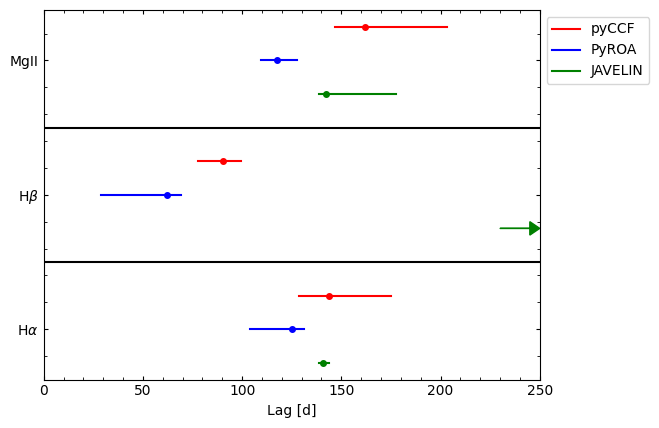

In [73]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(sharex=True)


ha_yvals = np.ones(2)
hb_yvals = np.ones(2)*2
mg2_yvals = np.ones(2)*3

pyccf_color = 'r'
pyroa_color = 'b'
javelin_color = 'g'


#ha
ax.plot( [ha_cent[1]-ha_cent[0], ha_cent[1]+ha_cent[2]], ha_yvals+.25, c=pyccf_color, label='pyCCF' )
ax.plot( [ha_cent[1]], ha_yvals[0]+.25, marker='.', lw=0, c=pyccf_color, ms=8  )

ax.plot( [ha_pyroalag[1]-ha_pyroalag[0], ha_pyroalag[1]+ha_pyroalag[2]], ha_yvals, c=pyroa_color, label='PyROA' )  
ax.plot( [ha_pyroalag[1]], ha_yvals[0], marker='.', lw=0, c=pyroa_color, ms=8 )

ax.plot( [ha_javlag[1]-ha_javlag[0], ha_javlag[1]+ha_javlag[2]], ha_yvals-.25, c=javelin_color, label='JAVELIN' )
ax.plot( [ha_javlag[1]], ha_yvals[0]-.25, marker='.', lw=0, c=javelin_color, ms=8 )



#hb
ax.plot( [hb_cent[1]-hb_cent[0], hb_cent[1]+hb_cent[2]], hb_yvals+.25, c=pyccf_color )
ax.plot( [hb_cent[1]], hb_yvals[0]+.25, marker='.', lw=0, c=pyccf_color, ms=8 )

ax.plot( [hb_pyroalag[1]-hb_pyroalag[0], hb_pyroalag[1]+hb_pyroalag[2]], hb_yvals, c=pyroa_color )
ax.plot( [hb_pyroalag[1]], hb_yvals[0], marker='.', lw=0, c=pyroa_color, ms=8 )

ax.plot( [hb_javlag[1]-hb_javlag[0], hb_javlag[1]+hb_javlag[2]], hb_yvals-.25, c=javelin_color )
ax.plot( [hb_javlag[1]], hb_yvals[0]-.25, marker='.', lw=0, c=javelin_color, ms=8 )



#mg2
ax.plot( [mg2_cent[1]-mg2_cent[0], mg2_cent[1]+mg2_cent[2]], mg2_yvals+.25, c=pyccf_color )
ax.plot( [mg2_cent[1]], mg2_yvals[0]+.25, marker='.', lw=0, c=pyccf_color, ms=8 )

ax.plot( [mg2_pyroalag[1]-mg2_pyroalag[0], mg2_pyroalag[1]+mg2_pyroalag[2]], mg2_yvals, c=pyroa_color )
ax.plot( [mg2_pyroalag[1]], mg2_yvals[0], marker='.', lw=0, c=pyroa_color, ms=8 )

ax.plot( [mg2_javlag[1]-mg2_javlag[0], mg2_javlag[1]+mg2_javlag[2]], mg2_yvals-.25, c=javelin_color )
ax.plot( [mg2_javlag[1]], mg2_yvals[0]-.25, marker='.', lw=0, c=javelin_color, ms=8 )


ax.arrow( 230, hb_yvals[0]-.25, 15, 0, head_width=.1, head_length=5, fc='g', ec='g' )

ax.set_yticks([ 1, 2, 3 ])
ax.set_yticklabels([r'H$\alpha$', r'H$\beta$', 'MgII'])

ax.axhline(2.5, color='k')
ax.axhline(1.5, color='k')

ax.legend(bbox_to_anchor=(1,1))
ax.set_xlim(0, 250)
ax.set_xlabel('Lag [d]')



plt.show()

We can see that in general, the lags agree each other (with lags from PyROA being shorter than the other two by $\sim 20 \ d$). The PyROA lags could be improved by choosing a different delay distribution, or adding more samples.

The JAVELIN and pyCCF lags agree well on ${\rm H}\alpha$ and ${\rm MgII}$, but not on ${H \beta}$ due to aliasing from the seasonal gaps. This could be improved either by adjusting the number of chain samples in JAVELIN, or the weighting procedure.